## Projet : Analyse 360° du Marché E-commerce (TV, Smartphones, Électroménager)

**Objectif** : Comparer **5 enseignes** (Darty, Boulanger, Amazon FR, Cdiscount, Fnac) sur leurs prix, disponibilités, notes clients et caractéristiques techniques pour identifier des opportunités business.

## 1. Scraping Amazon avec Beautiful soup et selenium

In [55]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from bs4 import BeautifulSoup
import time
import re
import csv
from datetime import datetime

# Configurer Chrome pour le mode sans interface graphique
options = Options()
options.add_argument('--headless')  # Retirez cette ligne si vous voulez voir le navigateur
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')
options.add_argument("user-agent=Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/115.0.0.0 Safari/537.36")

# Liste des catégories à scraper avec leurs termes de recherche
categories = [
    {"nom": "TV", "recherche": "tv+led"},
    {"nom": "Smartphones", "recherche": "smartphone"},
    {"nom": "Électroménager", "recherche": "electromenager"}
]

# Fonction pour extraire le prix
def extraire_prix(produit):
    # Essayer plusieurs sélecteurs possibles pour le prix
    prix_element = produit.select_one('.a-price .a-offscreen')
    
    if prix_element:
        prix_text = prix_element.text.strip()
        # Extraction du prix avec regex
        match = re.search(r'(\d+[,.]?\d*)', prix_text.replace(' ', ''))
        if match:
            try:
                return float(match.group(1).replace(',', '.'))
            except ValueError:
                return None
    return None

# Fonction pour extraire la note
def extraire_note(produit):
    # Essayer différents sélecteurs pour les notes
    note_element = produit.select_one('.a-icon-star-small .a-icon-alt') or \
                  produit.select_one('.a-icon-star .a-icon-alt')
    
    if note_element:
        note_text = note_element.text.strip()
        match = re.search(r'(\d+[,.]?\d*)', note_text)
        if match:
            try:
                return float(match.group(1).replace(',', '.'))
            except ValueError:
                return None
    return None

# Liste pour stocker tous les résultats
tous_resultats = []

# Scraper chaque catégorie
for categorie in categories:
    print(f"\n--- Scraping de la catégorie: {categorie['nom']} ---")
    
    # Initialiser le navigateur
    driver = webdriver.Chrome(options=options)
    
    # Construire l'URL de recherche
    url = f"https://www.amazon.fr/s?k={categorie['recherche']}"
    print(f"URL: {url}")
    
    driver.get(url)
    
    try:
        # Attendre que le bouton "Accepter les cookies" apparaisse (max 10 secondes)
        wait = WebDriverWait(driver, 10)
        bouton_cookies = wait.until(EC.element_to_be_clickable((By.ID, "sp-cc-accept")))
        bouton_cookies.click()
        print("✅ Cookies acceptés automatiquement.")
    except Exception as e:
        print(f"❌ Pas de bouton de cookies détecté ou délai dépassé: {e}")

    # Attendre que la page se charge complètement
    time.sleep(5)

    # Extraire le HTML après chargement complet
    soup = BeautifulSoup(driver.page_source, "html.parser")

    # Fermer le navigateur
    driver.quit()

    # Récupération des produits - sélecteur mis à jour
    produits = soup.select('div[data-component-type="s-search-result"]')
    print(f"Nombre de produits trouvés: {len(produits)}")

    # Scraper au maximum 10 produits par catégorie
    for i, produit in enumerate(produits[:10]):
        # Sélecteurs mis à jour pour le nom avec plusieurs alternatives
        nom_element = produit.select_one('h2 span') or \
                     produit.select_one('h2 a span') or \
                     produit.select_one('h2') or \
                     produit.select_one('.a-size-base-plus.a-color-base.a-text-normal') or \
                     produit.select_one('.a-size-medium.a-color-base.a-text-normal') or \
                     produit.select_one('.a-text-normal')
        
        nom = nom_element.text.strip() if nom_element else "Nom non trouvé"
        
        # Livraison
        livraison_element = produit.select_one('.a-row.a-size-base .a-color-secondary') or \
                            produit.select_one('.a-row .a-text-bold')
        livraison_texte = livraison_element.text.strip() if livraison_element else "Info livraison non trouvée"
        
        prix = extraire_prix(produit)
        note = extraire_note(produit)
        
        # Créer un dictionnaire avec les données du produit
        produit_data = {
            'categorie': categorie['nom'],
            'enseigne': 'Amazon',
            'nom': nom,
            'prix': prix,
            'note_client': note,
            'livraison': livraison_texte
        }
        
        # Ajouter à la liste des résultats
        tous_resultats.append(produit_data)
        
        # Afficher dans la console
        print(f"\nProduit {i+1}:")
        print(produit_data)

# Afficher un résumé
print(f"\n--- Résumé du scraping ---")
print(f"Nombre total de produits scrapés: {len(tous_resultats)}")
for categorie in categories:
    categorie_count = sum(1 for item in tous_resultats if item['categorie'] == categorie['nom'])
    print(f"Catégorie {categorie['nom']}: {categorie_count} produits")

# Enregistrer les résultats dans un fichier CSV
if tous_resultats:
    # Créer un nom de fichier avec la date et l'heure actuelles
    timestamp = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    nom_fichier = f"amazon_produits_{timestamp}.csv"
    
    # Déterminer les en-têtes à partir du premier résultat
    en_tetes = tous_resultats[0].keys()
    
    try:
        with open(nom_fichier, 'w', newline='', encoding='utf-8') as fichier_csv:
            writer = csv.DictWriter(fichier_csv, fieldnames=en_tetes)
            writer.writeheader()
            writer.writerows(tous_resultats)
        print(f"\n✅ Données sauvegardées avec succès dans '{nom_fichier}' ({len(tous_resultats)} produits)")
    except Exception as e:
        print(f"\n❌ Erreur lors de l'enregistrement du fichier CSV: {e}")

# Liste pour stocker les données des produits
resultats = []

for i, produit in enumerate(produits):
    # Sélecteurs mis à jour pour le nom avec plusieurs alternatives
    nom_element = produit.select_one('h2 span') or \
                 produit.select_one('h2 a span') or \
                 produit.select_one('h2') or \
                 produit.select_one('.a-size-base-plus.a-color-base.a-text-normal') or \
                 produit.select_one('.a-size-medium.a-color-base.a-text-normal') or \
                 produit.select_one('.a-text-normal')
    
    nom = nom_element.text.strip() if nom_element else "Nom non trouvé"
    
    # Débogage pour ce produit spécifique
    if nom == "Nom non trouvé":
        print("Débogage des sélecteurs pour le nom:")
        h2_tags = produit.select('h2')
        print(f"Nombre de tags h2: {len(h2_tags)}")
        if h2_tags:
            print(f"Contenu du premier h2: {h2_tags[0].text.strip()}")
    
    # Livraison
    livraison_element = produit.select_one('.a-row.a-size-base .a-color-secondary') or \
                        produit.select_one('.a-row .a-text-bold')
    livraison_texte = livraison_element.text.strip() if livraison_element else "Info livraison non trouvée"
    
    prix = extraire_prix(produit)
    note = extraire_note(produit)
    
    # Créer un dictionnaire avec les données du produit
    produit_data = {
        'enseigne': 'Amazon',
        'nom': nom,
        'prix': prix,
        'note_client': note,
        'livraison': livraison_texte
    }
    
    # Ajouter à la liste des résultats
    resultats.append(produit_data)
    
    # Afficher dans la console
    print(f"\nProduit {i+1}:")
    print(produit_data)

# Afficher un exemple de structure HTML pour déboguer
if len(produits) > 0:
    print("\nDébogage - Structure HTML détaillée du premier produit:")
    premier_produit = produits[0]
    
    # Afficher les balises h2
    print("\nBalises h2 dans le premier produit:")
    h2_tags = premier_produit.select('h2')
    for i, h2 in enumerate(h2_tags):
        print(f"h2 #{i+1}: {h2.text.strip()}")
        print(f"HTML: {h2}")
    
    # Afficher les balises avec class contenant "a-text-normal"
    print("\nBalises avec class contenant 'a-text-normal':")
    text_normal = premier_produit.select('[class*="a-text-normal"]')
    for i, elem in enumerate(text_normal):
        print(f"Élément #{i+1}: {elem.text.strip()}")
        print(f"HTML: {elem}")
    
    # Afficher la structure complète simplifiée
    print("\nStructure simplifiée du premier produit:")
    print(premier_produit.prettify()[:1000])  # Afficher les 1000 premiers caractères
else:
    print("Aucun produit trouvé. Vérifiez les sélecteurs ou la page source.")

# Enregistrer les résultats dans un fichier CSV
if resultats:
    # Créer un nom de fichier avec la date et l'heure actuelles
    timestamp = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    nom_fichier = f"amazon_tv_led_{timestamp}.csv"
    
    # Déterminer les en-têtes à partir du premier résultat
    en_tetes = resultats[0].keys()
    
    try:
        with open(nom_fichier, 'w', newline='', encoding='utf-8') as fichier_csv:
            writer = csv.DictWriter(fichier_csv, fieldnames=en_tetes)
            writer.writeheader()
            writer.writerows(resultats)
        print(f"\n✅ Données sauvegardées avec succès dans '{nom_fichier}' ({len(resultats)} produits)")
    except Exception as e:
        print(f"\n❌ Erreur lors de l'enregistrement du fichier CSV: {e}")

2025-05-16 12:39:04 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 12:39:04 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json



--- Scraping de la catégorie: TV ---


2025-05-16 12:39:04 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 12:39:04 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 12:39:04 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 10260 using 0 to output -3
2025-05-16 12:39:05 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:54872/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', 'user-agen

URL: https://www.amazon.fr/s?k=tv+led


2025-05-16 12:39:07 [urllib3.connectionpool] DEBUG: http://localhost:54872 "POST /session/0a1d30cf6ca70592b7cf2e7d5dce09b6/url HTTP/11" 200 0
2025-05-16 12:39:07 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":null} | headers=HTTPHeaderDict({'Content-Length': '14', 'Content-Type': 'application/json; charset=utf-8', 'cache-control': 'no-cache'})
2025-05-16 12:39:07 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2025-05-16 12:39:07 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:54872/session/0a1d30cf6ca70592b7cf2e7d5dce09b6/element {'using': 'css selector', 'value': '[id="sp-cc-accept"]'}
2025-05-16 12:39:07 [urllib3.connectionpool] DEBUG: http://localhost:54872 "POST /session/0a1d30cf6ca70592b7cf2e7d5dce09b6/element HTTP/11" 200 0
2025-05-16 12:39:07 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":{"element-6066-11e4-a52e-4f735466cecf":"f.6

✅ Cookies acceptés automatiquement.


2025-05-16 12:39:16 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:54872/session/0a1d30cf6ca70592b7cf2e7d5dce09b6/source {}
2025-05-16 12:39:17 [urllib3.connectionpool] DEBUG: http://localhost:54872 "GET /session/0a1d30cf6ca70592b7cf2e7d5dce09b6/source HTTP/11" 200 0
2025-05-16 12:39:17 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr-fr\" class=\" a-js a-audio a-video a-canvas a-svg a-drag-drop a-geolocation a-history a-webworker a-autofocus a-input-placeholder a-textarea-placeholder a-local-storage a-gradients a-transform3d a-touch-scrolling a-text-shadow a-text-stroke a-box-shadow a-border-radius a-border-image a-opacity a-transform a-transition null\" data-19ax5a9jf=\"dingo\" data-aui-build-date=\"3.25.3-2025-05-13\" style=\"scroll-padding-bottom: 0px;\">\u003C!-- sp:feature:head-start -->\u003Chead>\u003Cscript async=\"\" src=\"https://images-eu.ssl-images-amazon.com/images/I/216YVwoRF

Nombre de produits trouvés: 60

Produit 1:
{'categorie': 'TV', 'enseigne': 'Amazon', 'nom': "THOMSON 32'' (80 cm) HD - LED Fire TV - Commande vocale Alexa, Support AirPlay, Triple Tuner, Bluetooth, HDMI, Ports USB, AV in et CI+ - 32HF2S34-2024", 'prix': 159.0, 'note_client': 4.1, 'livraison': 'Plus de 500 achetés au cours du mois dernier'}

Produit 2:
{'categorie': 'TV', 'enseigne': 'Amazon', 'nom': 'THOMSON – 55 Pouces (139 cm) Ultra HD Blanc – Smart Android – WLAN, Triple-Tuner, USB, HDMI, DVB-C/S2/T2, AV in, CI+, A+ Panel – 55UA5S13W – 2025', 'prix': 339.0, 'note_client': 4.1, 'livraison': 'Plus de 200 achetés au cours du mois dernier'}

Produit 3:
{'categorie': 'TV', 'enseigne': 'Amazon', 'nom': 'Smart Tech 40FN01V3 Full HD LED TV 40 Pouces (101cm) Triple Tuner Dolby Audio H.265 3xHDMI, 2xUSB', 'prix': 189.9, 'note_client': 4.2, 'livraison': 'Plus de 50 achetés au cours du mois dernier'}

Produit 4:
{'categorie': 'TV', 'enseigne': 'Amazon', 'nom': "Smart Tech TV LED Full HD 40' (10

2025-05-16 12:39:20 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 12:39:20 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 12:39:20 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 11008 using 0 to output -3
2025-05-16 12:39:21 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:54923/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', 'user-agen

URL: https://www.amazon.fr/s?k=smartphone


2025-05-16 12:39:23 [urllib3.connectionpool] DEBUG: http://localhost:54923 "POST /session/ba17f9a483d251869d0342804866b3c6/url HTTP/11" 200 0
2025-05-16 12:39:23 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":null} | headers=HTTPHeaderDict({'Content-Length': '14', 'Content-Type': 'application/json; charset=utf-8', 'cache-control': 'no-cache'})
2025-05-16 12:39:23 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2025-05-16 12:39:23 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:54923/session/ba17f9a483d251869d0342804866b3c6/element {'using': 'css selector', 'value': '[id="sp-cc-accept"]'}
2025-05-16 12:39:23 [urllib3.connectionpool] DEBUG: http://localhost:54923 "POST /session/ba17f9a483d251869d0342804866b3c6/element HTTP/11" 200 0
2025-05-16 12:39:23 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":{"element-6066-11e4-a52e-4f735466cecf":"f.D

✅ Cookies acceptés automatiquement.


2025-05-16 12:39:33 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:54923/session/ba17f9a483d251869d0342804866b3c6/source {}
2025-05-16 12:39:33 [urllib3.connectionpool] DEBUG: http://localhost:54923 "GET /session/ba17f9a483d251869d0342804866b3c6/source HTTP/11" 200 0
2025-05-16 12:39:33 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr-fr\" class=\" a-js a-audio a-video a-canvas a-svg a-drag-drop a-geolocation a-history a-webworker a-autofocus a-input-placeholder a-textarea-placeholder a-local-storage a-gradients a-transform3d a-touch-scrolling a-text-shadow a-text-stroke a-box-shadow a-border-radius a-border-image a-opacity a-transform a-transition null\" data-19ax5a9jf=\"dingo\" data-aui-build-date=\"3.25.3-2025-05-13\" style=\"scroll-padding-bottom: 0px;\">\u003C!-- sp:feature:head-start -->\u003Chead>\u003Cscript async=\"\" src=\"https://images-eu.ssl-images-amazon.com/images/I/216YVwoRF

Nombre de produits trouvés: 60

Produit 1:
{'categorie': 'Smartphones', 'enseigne': 'Amazon', 'nom': 'Nothing Phone (3a) 128 GB - Smartphone avec Appareil Photo Frontal 32 MP, Ultra Zoom x30, Charge Rapide 50 W et écran AMOLED Flexible de 6,77" FHD+ - Noir', 'prix': 344.72, 'note_client': 4.5, 'livraison': 'Plus de 100 achetés au cours du mois dernier'}

Produit 2:
{'categorie': 'Smartphones', 'enseigne': 'Amazon', 'nom': "DOOGEE Blade10 Telephone Portable Incassable Android 15, 20GB+128GB/TF 2TB, 10.7mm 6.56'', 5150 mAh Smartphone Incassable, Octa-Core, Caméra 16MP Téléphone, IP68/I69K/4G Dual SIM/Face ID", 'prix': 159.99, 'note_client': 5.0, 'livraison': 'Le plus bas\xa0:'}

Produit 3:
{'categorie': 'Smartphones', 'enseigne': 'Amazon', 'nom': "DOOGEE N55 (2025) Smartphone Android 15, 16GB RAM+128GB ROM/TF 2TB, 6.56'' HD+90 Hz, Octa-Core Unisoc T7200, Telephone Portable Batterie 5150mAh, Caméra AI 13MP/Widevine L1/OTG/Dual Nano SIM/Face ID", 'prix': 109.99, 'note_client': 4.8, 'livrai

2025-05-16 12:39:36 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 12:39:36 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 12:39:36 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 26848 using 0 to output -3
2025-05-16 12:39:37 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:54973/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', 'user-agen

URL: https://www.amazon.fr/s?k=electromenager


2025-05-16 12:39:39 [urllib3.connectionpool] DEBUG: http://localhost:54973 "POST /session/77685f0582aa72d47f6fae1000404594/url HTTP/11" 200 0
2025-05-16 12:39:39 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":null} | headers=HTTPHeaderDict({'Content-Length': '14', 'Content-Type': 'application/json; charset=utf-8', 'cache-control': 'no-cache'})
2025-05-16 12:39:39 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2025-05-16 12:39:39 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:54973/session/77685f0582aa72d47f6fae1000404594/element {'using': 'css selector', 'value': '[id="sp-cc-accept"]'}
2025-05-16 12:39:39 [urllib3.connectionpool] DEBUG: http://localhost:54973 "POST /session/77685f0582aa72d47f6fae1000404594/element HTTP/11" 200 0
2025-05-16 12:39:39 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":{"element-6066-11e4-a52e-4f735466cecf":"f.4

✅ Cookies acceptés automatiquement.


2025-05-16 12:39:48 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:54973/session/77685f0582aa72d47f6fae1000404594/source {}
2025-05-16 12:39:48 [urllib3.connectionpool] DEBUG: http://localhost:54973 "GET /session/77685f0582aa72d47f6fae1000404594/source HTTP/11" 200 0
2025-05-16 12:39:48 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr-fr\" class=\" a-js a-audio a-video a-canvas a-svg a-drag-drop a-geolocation a-history a-webworker a-autofocus a-input-placeholder a-textarea-placeholder a-local-storage a-gradients a-transform3d a-touch-scrolling a-text-shadow a-text-stroke a-box-shadow a-border-radius a-border-image a-opacity a-transform a-transition null\" data-19ax5a9jf=\"dingo\" data-aui-build-date=\"3.25.3-2025-05-13\" style=\"scroll-padding-bottom: 0px;\">\u003C!-- sp:feature:head-start -->\u003Chead>\u003Cscript async=\"\" src=\"https://images-eu.ssl-images-amazon.com/images/I/216YVwoRF

Nombre de produits trouvés: 60

Produit 1:
{'categorie': 'Électroménager', 'enseigne': 'Amazon', 'nom': 'Amazon Basics Scelleuse sous vide, Automatique, joint de 30 cm+10 sacs de scellage, noirs', 'prix': 34.9, 'note_client': 4.3, 'livraison': 'Plus de 30 achetés au cours du mois dernier'}

Produit 2:
{'categorie': 'Électroménager', 'enseigne': 'Amazon', 'nom': "De'Longhi Nespresso Inissia EN80.B, Machine à Café Automatique, Machine à Capsules pour une Seule Tasse, Ensemble de Bienvenue Inclus, Design Compact, 19 Bars, 1260W, Noir", 'prix': 70.0, 'note_client': 4.3, 'livraison': 'Plus de 2\xa0k achetés au cours du mois dernier'}

Produit 3:
{'categorie': 'Électroménager', 'enseigne': 'Amazon', 'nom': "De'Longhi Nespresso Essenza Mini EN85.R, Machine à Café Automatique, Machine à Capsules pour une Seule Tasse, Ensemble de Bienvenue Inclus, Design Compact, Pression 19 Bar, 1150W, Rouge Rubis", 'prix': 80.0, 'note_client': 4.4, 'livraison': 'Plus de 100 achetés au cours du mois dernier'}


In [65]:
import pandas as pd

# Chargement des données scrapées
df = pd.read_csv("amazon_tv_led_2025-05-16_12-39-51.csv")

df


,enseigne,nom,prix,note_client,livraison
0,Amazon,"Amazon Basics Scelleuse sous vide, Automatique...",34.90,4.3,Plus de 30 achetés au cours du mois dernier
1,Amazon,"De'Longhi Nespresso Inissia EN80.B, Machine à ...",70.00,4.3,Plus de 2 k achetés au cours du mois dernier
2,Amazon,"De'Longhi Nespresso Essenza Mini EN85.R, Machi...",80.00,4.4,Plus de 100 achetés au cours du mois dernier
3,Amazon,"NINJA Double Stack XL Air Fryer, Friteuse sans...",229.99,4.6,Plus de 200 achetés au cours du mois dernier
4,Amazon,"Philips Grille-pain - 2 Fentes, 8 Réglages, Ré...",19.99,4.5,Plus de 2 k achetés au cours du mois dernier
5,Amazon,"Moulinex Presse-agrume électrique, Double rota...",15.99,4.6,Plus de 1 k achetés au cours du mois dernier
6,Amazon,GRIFEMA GA2002 Balance de Cuisine Électronique...,8.99,4.5,Plus de 4 k achetés au cours du mois dernier
7,Amazon,"Philips Blender, 450 Watts, Technologie Proble...",28.48,4.3,Plus de 1 k achetés au cours du mois dernier
8,Amazon,"Moulinex Découpe-légumes électrique, Râpe 3-en...",34.99,4.4,Plus de 3 k achetés au cours du mois dernier
9,Amazon,Mandoline 16-en-1 - Coupe-Légumes Multifonctio...,20.99,3.5,Plus de 200 achetés au cours du mois dernier


2025-05-16 12:59:33 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 12:59:33 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json


🚀 DÉMARRAGE DU SCRAPING MULTI-SITES

===== CATÉGORIE: TV =====

--- Scraping DARTY pour TV ---
URL: https://www.darty.com/nav/recherche?text=tv led


2025-05-16 12:59:33 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 12:59:33 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 12:59:33 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 24792 using 0 to output -3
2025-05-16 12:59:34 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:55559/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', '--disable

⚠️ Gestion cookies Darty: Message: 
Stacktrace:
	GetHandleVerifier [0x00007FF63D1CCF65+75717]
	GetHandleVerifier [0x00007FF63D1CCFC0+75808]
	(No symbol) [0x00007FF63CF98F9A]
	(No symbol) [0x00007FF63CFEF4C6]
	(No symbol) [0x00007FF63CFEF77C]
	(No symbol) [0x00007FF63D042577]
	(No symbol) [0x00007FF63D0173BF]
	(No symbol) [0x00007FF63D03F39C]
	(No symbol) [0x00007FF63D017153]
	(No symbol) [0x00007FF63CFE0421]
	(No symbol) [0x00007FF63CFE11B3]
	GetHandleVerifier [0x00007FF63D4CD74D+3223469]
	GetHandleVerifier [0x00007FF63D4C7CF2+3200338]
	GetHandleVerifier [0x00007FF63D4E5B23+3322755]
	GetHandleVerifier [0x00007FF63D1E6A3A+180890]
	GetHandleVerifier [0x00007FF63D1EE13F+211359]
	GetHandleVerifier [0x00007FF63D1D52B4+109332]
	GetHandleVerifier [0x00007FF63D1D5462+109762]
	GetHandleVerifier [0x00007FF63D1BBA79+4825]
	BaseThreadInitThunk [0x00007FFA23FDE8D7+23]
	RtlUserThreadStart [0x00007FFA258DC5DC+44]



2025-05-16 12:59:54 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:55559/session/cf35170c96e0c2965d76238e9c0af0d4/source {}
2025-05-16 12:59:54 [urllib3.connectionpool] DEBUG: http://localhost:55559 "GET /session/cf35170c96e0c2965d76238e9c0af0d4/source HTTP/11" 200 0
2025-05-16 12:59:54 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr\">\u003Chead>\u003Ctitle>darty.com\u003C/title>\u003Cscript type=\"text/javascript\">/*\n Copyright and licenses see https://www.dynatrace.com/company/trust-center/customers/reports/ */\n(function(){function Ma(){var Ka;(Ka=void 0===cb.dialogArguments&&navigator.cookieEnabled)||(document.cookie=\"__dTCookie=1;SameSite=Lax\",Ka=document.cookie.includes(\"__dTCookie\"),Ka=(document.cookie=\"__dTCookie=1; expires=Thu, 01-Jan-1970 00:00:01 GMT\",Ka));return Ka}function Xa(){if(Ma()){var Ka=cb.dT_,Sa=null==Ka?void 0:Ka.platformPrefix,Ya;if(Ya=!Ka||Sa){var wa;(Ya=nu

Produits trouvés chez Darty: 0


2025-05-16 13:00:00 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 13:00:00 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json



--- Scraping BOULANGER pour TV ---
URL: https://www.boulanger.com/resultats?tr=tv led


2025-05-16 13:00:00 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 13:00:00 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 13:00:00 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 20968 using 0 to output -3
2025-05-16 13:00:01 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:55596/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', '--disable

⚠️ Gestion cookies Boulanger: Message: 
Stacktrace:
	GetHandleVerifier [0x00007FF63D1CCF65+75717]
	GetHandleVerifier [0x00007FF63D1CCFC0+75808]
	(No symbol) [0x00007FF63CF98F9A]
	(No symbol) [0x00007FF63CFEF4C6]
	(No symbol) [0x00007FF63CFEF77C]
	(No symbol) [0x00007FF63D042577]
	(No symbol) [0x00007FF63D0173BF]
	(No symbol) [0x00007FF63D03F39C]
	(No symbol) [0x00007FF63D017153]
	(No symbol) [0x00007FF63CFE0421]
	(No symbol) [0x00007FF63CFE11B3]
	GetHandleVerifier [0x00007FF63D4CD74D+3223469]
	GetHandleVerifier [0x00007FF63D4C7CF2+3200338]
	GetHandleVerifier [0x00007FF63D4E5B23+3322755]
	GetHandleVerifier [0x00007FF63D1E6A3A+180890]
	GetHandleVerifier [0x00007FF63D1EE13F+211359]
	GetHandleVerifier [0x00007FF63D1D52B4+109332]
	GetHandleVerifier [0x00007FF63D1D5462+109762]
	GetHandleVerifier [0x00007FF63D1BBA79+4825]
	BaseThreadInitThunk [0x00007FFA23FDE8D7+23]
	RtlUserThreadStart [0x00007FFA258DC5DC+44]



2025-05-16 13:00:21 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:55596/session/484ed384a61869db20c7684c4a47526f/source {}
2025-05-16 13:00:21 [urllib3.connectionpool] DEBUG: http://localhost:55596 "GET /session/484ed384a61869db20c7684c4a47526f/source HTTP/11" 200 0
2025-05-16 13:00:21 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml>\u003Chead>\n\u003Ctitle>Invalid URL\u003C/title>\n\u003C/head>\u003Cbody>\n\u003Ch1>Invalid URL\u003C/h1>\nThe requested URL \"[no URL]\", is invalid.\u003Cp>\nReference #9.18891402.1747393221.1d2b5290\n\u003C/p>\u003Cp>https://errors.edgesuite.net/9.18891402.1747393221.1d2b5290\u003C/p>\n\n\u003C/body>\u003C/html>"} | headers=HTTPHeaderDict({'Content-Length': '340', 'Content-Type': 'application/json; charset=utf-8', 'cache-control': 'no-cache'})
2025-05-16 13:00:21 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2025-05-16 13:00:21 [selenium.webd

Produits trouvés chez Boulanger: 0


2025-05-16 13:00:28 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 13:00:28 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json



--- Scraping CDISCOUNT pour TV ---
URL: https://www.cdiscount.com/search/10/tv+led.html


2025-05-16 13:00:28 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 13:00:28 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 13:00:28 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 13116 using 0 to output -3
2025-05-16 13:00:29 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:55631/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', '--disable

✅ Cookies Cdiscount acceptés


2025-05-16 13:00:41 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:55631/session/fda7d6afd76a254fa45961ff923c91cf/source {}
2025-05-16 13:00:41 [urllib3.connectionpool] DEBUG: http://localhost:55631 "GET /session/fda7d6afd76a254fa45961ff923c91cf/source HTTP/11" 200 0
2025-05-16 13:00:41 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr\" class=\"   reflist js\" style=\"--header-main--calcHeight: 92px; --scroll-padding--calcHeight: 108px;\">\u003Chead>\n\t\t\t\u003Cscript type=\"text/javascript\" src=\"https://www.googletagservices.com/tag/js/gpt.js\">\u003C/script>\u003Cscript type=\"text/javascript\">const kreelCookieName = 'kreel-referer'; const refererData = document.cookie.split(`${kreelCookieName}=`)?.[1]?.split?.(';')?.[0]; document.cookie = kreelCookieName + '=; Path=/; Expires=Thu, 01 Jan 1970 00:00:01 GMT;'; if (refererData) { Object.defineProperty(document, 'referrer', { get() { re
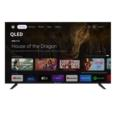
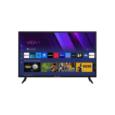
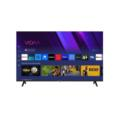
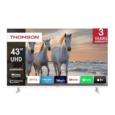
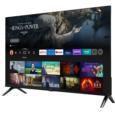
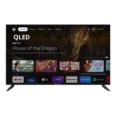
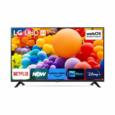

Produits trouvés chez Cdiscount: 0


2025-05-16 13:00:48 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 13:00:48 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json



--- Scraping FNAC pour TV ---
URL: https://www.fnac.com/SearchResult/ResultList.aspx?Search=tv%20led


2025-05-16 13:00:49 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 13:00:49 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 13:00:49 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 15796 using 0 to output -3
2025-05-16 13:00:49 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:55713/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', '--disable

⚠️ Gestion cookies Fnac: Message: 
Stacktrace:
	GetHandleVerifier [0x00007FF63D1CCF65+75717]
	GetHandleVerifier [0x00007FF63D1CCFC0+75808]
	(No symbol) [0x00007FF63CF98F9A]
	(No symbol) [0x00007FF63CFEF4C6]
	(No symbol) [0x00007FF63CFEF77C]
	(No symbol) [0x00007FF63D042577]
	(No symbol) [0x00007FF63D0173BF]
	(No symbol) [0x00007FF63D03F39C]
	(No symbol) [0x00007FF63D017153]
	(No symbol) [0x00007FF63CFE0421]
	(No symbol) [0x00007FF63CFE11B3]
	GetHandleVerifier [0x00007FF63D4CD74D+3223469]
	GetHandleVerifier [0x00007FF63D4C7CF2+3200338]
	GetHandleVerifier [0x00007FF63D4E5B23+3322755]
	GetHandleVerifier [0x00007FF63D1E6A3A+180890]
	GetHandleVerifier [0x00007FF63D1EE13F+211359]
	GetHandleVerifier [0x00007FF63D1D52B4+109332]
	GetHandleVerifier [0x00007FF63D1D5462+109762]
	GetHandleVerifier [0x00007FF63D1BBA79+4825]
	BaseThreadInitThunk [0x00007FFA23FDE8D7+23]
	RtlUserThreadStart [0x00007FFA258DC5DC+44]



2025-05-16 13:01:11 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:55713/session/d5a1f7c9bafee6f864d72572ea53e627/source {}
2025-05-16 13:01:11 [urllib3.connectionpool] DEBUG: http://localhost:55713 "GET /session/d5a1f7c9bafee6f864d72572ea53e627/source HTTP/11" 200 0
2025-05-16 13:01:11 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr\">\u003Chead>\u003Ctitle>fnac.com\u003C/title>\u003Cstyle>#cmsg{animation: A 1.5s;}@keyframes A{0%{opacity:0;}99%{opacity:0;}100%{opacity:1;}}\u003C/style>\u003Cmeta name=\"viewport\" content=\"width=device-width, initial-scale=1.0\">\u003C/head>\u003Cbody style=\"margin:0\">\u003Cscript data-cfasync=\"false\">var dd={'rt':'c','cid':'AHrlqAAAAAMAVHVsUcLye7YAWHix6Q==','hsh':'4BA90718940D0114F409A57DFAF6AF','t':'fe','qp':'','s':3909,'e':'78957ca77c675d45a0ecd796dc673325425ffcd1d03ab0c07b8845d41bd9c7a7','host':'geo.captcha-delivery.com','cookie':'GsO9O7ZfhoiOgxRb

Produits trouvés chez Fnac: 0


2025-05-16 13:01:18 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 13:01:18 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json



===== CATÉGORIE: Smartphones =====

--- Scraping DARTY pour Smartphones ---
URL: https://www.darty.com/nav/recherche?text=smartphone


2025-05-16 13:01:18 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 13:01:18 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 13:01:18 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 23224 using 0 to output -3
2025-05-16 13:01:19 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:55854/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', '--disable

⚠️ Gestion cookies Darty: Message: 
Stacktrace:
	GetHandleVerifier [0x00007FF63D1CCF65+75717]
	GetHandleVerifier [0x00007FF63D1CCFC0+75808]
	(No symbol) [0x00007FF63CF98F9A]
	(No symbol) [0x00007FF63CFEF4C6]
	(No symbol) [0x00007FF63CFEF77C]
	(No symbol) [0x00007FF63D042577]
	(No symbol) [0x00007FF63D0173BF]
	(No symbol) [0x00007FF63D03F39C]
	(No symbol) [0x00007FF63D017153]
	(No symbol) [0x00007FF63CFE0421]
	(No symbol) [0x00007FF63CFE11B3]
	GetHandleVerifier [0x00007FF63D4CD74D+3223469]
	GetHandleVerifier [0x00007FF63D4C7CF2+3200338]
	GetHandleVerifier [0x00007FF63D4E5B23+3322755]
	GetHandleVerifier [0x00007FF63D1E6A3A+180890]
	GetHandleVerifier [0x00007FF63D1EE13F+211359]
	GetHandleVerifier [0x00007FF63D1D52B4+109332]
	GetHandleVerifier [0x00007FF63D1D5462+109762]
	GetHandleVerifier [0x00007FF63D1BBA79+4825]
	BaseThreadInitThunk [0x00007FFA23FDE8D7+23]
	RtlUserThreadStart [0x00007FFA258DC5DC+44]



2025-05-16 13:01:41 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:55854/session/758cf1678d6d40a91bc8ebee12c5660e/source {}
2025-05-16 13:01:41 [urllib3.connectionpool] DEBUG: http://localhost:55854 "GET /session/758cf1678d6d40a91bc8ebee12c5660e/source HTTP/11" 200 0
2025-05-16 13:01:41 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr\">\u003Chead>\u003Ctitle>darty.com\u003C/title>\u003Cscript type=\"text/javascript\">/*\n Copyright and licenses see https://www.dynatrace.com/company/trust-center/customers/reports/ */\n(function(){function Ma(){var Ka;(Ka=void 0===cb.dialogArguments&&navigator.cookieEnabled)||(document.cookie=\"__dTCookie=1;SameSite=Lax\",Ka=document.cookie.includes(\"__dTCookie\"),Ka=(document.cookie=\"__dTCookie=1; expires=Thu, 01-Jan-1970 00:00:01 GMT\",Ka));return Ka}function Xa(){if(Ma()){var Ka=cb.dT_,Sa=null==Ka?void 0:Ka.platformPrefix,Ya;if(Ya=!Ka||Sa){var wa;(Ya=nu

Produits trouvés chez Darty: 0


2025-05-16 13:01:47 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 13:01:47 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json



--- Scraping BOULANGER pour Smartphones ---
URL: https://www.boulanger.com/resultats?tr=smartphone


2025-05-16 13:01:48 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 13:01:48 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 13:01:48 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 19188 using 0 to output -3
2025-05-16 13:01:48 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:55894/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', '--disable

⚠️ Gestion cookies Boulanger: Message: 
Stacktrace:
	GetHandleVerifier [0x00007FF63D1CCF65+75717]
	GetHandleVerifier [0x00007FF63D1CCFC0+75808]
	(No symbol) [0x00007FF63CF98F9A]
	(No symbol) [0x00007FF63CFEF4C6]
	(No symbol) [0x00007FF63CFEF77C]
	(No symbol) [0x00007FF63D042577]
	(No symbol) [0x00007FF63D0173BF]
	(No symbol) [0x00007FF63D03F39C]
	(No symbol) [0x00007FF63D017153]
	(No symbol) [0x00007FF63CFE0421]
	(No symbol) [0x00007FF63CFE11B3]
	GetHandleVerifier [0x00007FF63D4CD74D+3223469]
	GetHandleVerifier [0x00007FF63D4C7CF2+3200338]
	GetHandleVerifier [0x00007FF63D4E5B23+3322755]
	GetHandleVerifier [0x00007FF63D1E6A3A+180890]
	GetHandleVerifier [0x00007FF63D1EE13F+211359]
	GetHandleVerifier [0x00007FF63D1D52B4+109332]
	GetHandleVerifier [0x00007FF63D1D5462+109762]
	GetHandleVerifier [0x00007FF63D1BBA79+4825]
	BaseThreadInitThunk [0x00007FFA23FDE8D7+23]
	RtlUserThreadStart [0x00007FFA258DC5DC+44]



2025-05-16 13:02:08 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:55894/session/105f36c4eb6a3a1d8c898809fece2c26/source {}
2025-05-16 13:02:08 [urllib3.connectionpool] DEBUG: http://localhost:55894 "GET /session/105f36c4eb6a3a1d8c898809fece2c26/source HTTP/11" 200 0
2025-05-16 13:02:08 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml>\u003Chead>\n\u003Ctitle>Invalid URL\u003C/title>\n\u003C/head>\u003Cbody>\n\u003Ch1>Invalid URL\u003C/h1>\nThe requested URL \"[no URL]\", is invalid.\u003Cp>\nReference #9.212a1202.1747393327.6ce07d1\n\u003C/p>\u003Cp>https://errors.edgesuite.net/9.212a1202.1747393327.6ce07d1\u003C/p>\n\n\u003C/body>\u003C/html>"} | headers=HTTPHeaderDict({'Content-Length': '338', 'Content-Type': 'application/json; charset=utf-8', 'cache-control': 'no-cache'})
2025-05-16 13:02:08 [selenium.webdriver.remote.remote_connection] DEBUG: Finished Request
2025-05-16 13:02:08 [selenium.webdri

Produits trouvés chez Boulanger: 0


2025-05-16 13:02:14 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 13:02:14 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json



--- Scraping CDISCOUNT pour Smartphones ---
URL: https://www.cdiscount.com/search/10/smartphone.html


2025-05-16 13:02:14 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 13:02:14 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 13:02:14 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 19196 using 0 to output -3
2025-05-16 13:02:15 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:55938/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', '--disable

✅ Cookies Cdiscount acceptés


2025-05-16 13:02:27 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:55938/session/3bcda1ce53a235a0c4b513e813fdd758/source {}
2025-05-16 13:02:27 [urllib3.connectionpool] DEBUG: http://localhost:55938 "GET /session/3bcda1ce53a235a0c4b513e813fdd758/source HTTP/11" 200 0
2025-05-16 13:02:27 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr\" class=\"   reflist js\" style=\"--header-main--calcHeight: 92px; --scroll-padding--calcHeight: 108px;\">\u003Chead>\n\t\t\t\u003Cscript type=\"text/javascript\" src=\"https://www.googletagservices.com/tag/js/gpt.js\">\u003C/script>\u003Cscript type=\"text/javascript\">const kreelCookieName = 'kreel-referer'; const refererData = document.cookie.split(`${kreelCookieName}=`)?.[1]?.split?.(';')?.[0]; document.cookie = kreelCookieName + '=; Path=/; Expires=Thu, 01 Jan 1970 00:00:01 GMT;'; if (refererData) { Object.defineProperty(document, 'referrer', { get() { re
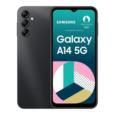
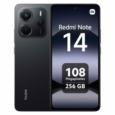
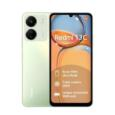
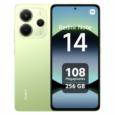
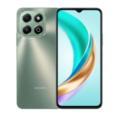
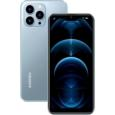
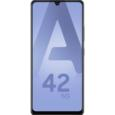

Produits trouvés chez Cdiscount: 0


2025-05-16 13:02:34 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 13:02:34 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json



--- Scraping FNAC pour Smartphones ---
URL: https://www.fnac.com/SearchResult/ResultList.aspx?Search=smartphone


2025-05-16 13:02:35 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 13:02:35 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 13:02:35 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 23072 using 0 to output -3
2025-05-16 13:02:35 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:56031/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', '--disable

⚠️ Gestion cookies Fnac: Message: 
Stacktrace:
	GetHandleVerifier [0x00007FF63D1CCF65+75717]
	GetHandleVerifier [0x00007FF63D1CCFC0+75808]
	(No symbol) [0x00007FF63CF98F9A]
	(No symbol) [0x00007FF63CFEF4C6]
	(No symbol) [0x00007FF63CFEF77C]
	(No symbol) [0x00007FF63D042577]
	(No symbol) [0x00007FF63D0173BF]
	(No symbol) [0x00007FF63D03F39C]
	(No symbol) [0x00007FF63D017153]
	(No symbol) [0x00007FF63CFE0421]
	(No symbol) [0x00007FF63CFE11B3]
	GetHandleVerifier [0x00007FF63D4CD74D+3223469]
	GetHandleVerifier [0x00007FF63D4C7CF2+3200338]
	GetHandleVerifier [0x00007FF63D4E5B23+3322755]
	GetHandleVerifier [0x00007FF63D1E6A3A+180890]
	GetHandleVerifier [0x00007FF63D1EE13F+211359]
	GetHandleVerifier [0x00007FF63D1D52B4+109332]
	GetHandleVerifier [0x00007FF63D1D5462+109762]
	GetHandleVerifier [0x00007FF63D1BBA79+4825]
	BaseThreadInitThunk [0x00007FFA23FDE8D7+23]
	RtlUserThreadStart [0x00007FFA258DC5DC+44]



2025-05-16 13:02:58 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:56031/session/5d096482b43d846e35cc612f260d8590/source {}
2025-05-16 13:02:58 [urllib3.connectionpool] DEBUG: http://localhost:56031 "GET /session/5d096482b43d846e35cc612f260d8590/source HTTP/11" 200 0
2025-05-16 13:02:58 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr\">\u003Chead>\u003Ctitle>fnac.com\u003C/title>\u003Cstyle>#cmsg{animation: A 1.5s;}@keyframes A{0%{opacity:0;}99%{opacity:0;}100%{opacity:1;}}\u003C/style>\u003Cmeta name=\"viewport\" content=\"width=device-width, initial-scale=1.0\">\u003C/head>\u003Cbody style=\"margin:0\">\u003Cscript data-cfasync=\"false\">var dd={'rt':'c','cid':'AHrlqAAAAAMAOnYbgpAjNOAAWHix6Q==','hsh':'4BA90718940D0114F409A57DFAF6AF','t':'fe','qp':'','s':3909,'e':'78957ca77c675d45a0ecd796dc673325bc163427dc332f46530edded11e92792','host':'geo.captcha-delivery.com','cookie':'99TPX09Xv9c4YlUZ

Produits trouvés chez Fnac: 0


2025-05-16 13:03:04 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 13:03:04 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json



===== CATÉGORIE: Électroménager =====

--- Scraping DARTY pour Électroménager ---
URL: https://www.darty.com/nav/recherche?text=electromenager refrigerateur


2025-05-16 13:03:04 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 13:03:04 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 13:03:04 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 11768 using 0 to output -3
2025-05-16 13:03:05 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:56081/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', '--disable

⚠️ Gestion cookies Darty: Message: 
Stacktrace:
	GetHandleVerifier [0x00007FF63D1CCF65+75717]
	GetHandleVerifier [0x00007FF63D1CCFC0+75808]
	(No symbol) [0x00007FF63CF98F9A]
	(No symbol) [0x00007FF63CFEF4C6]
	(No symbol) [0x00007FF63CFEF77C]
	(No symbol) [0x00007FF63D042577]
	(No symbol) [0x00007FF63D0173BF]
	(No symbol) [0x00007FF63D03F39C]
	(No symbol) [0x00007FF63D017153]
	(No symbol) [0x00007FF63CFE0421]
	(No symbol) [0x00007FF63CFE11B3]
	GetHandleVerifier [0x00007FF63D4CD74D+3223469]
	GetHandleVerifier [0x00007FF63D4C7CF2+3200338]
	GetHandleVerifier [0x00007FF63D4E5B23+3322755]
	GetHandleVerifier [0x00007FF63D1E6A3A+180890]
	GetHandleVerifier [0x00007FF63D1EE13F+211359]
	GetHandleVerifier [0x00007FF63D1D52B4+109332]
	GetHandleVerifier [0x00007FF63D1D5462+109762]
	GetHandleVerifier [0x00007FF63D1BBA79+4825]
	BaseThreadInitThunk [0x00007FFA23FDE8D7+23]
	RtlUserThreadStart [0x00007FFA258DC5DC+44]



2025-05-16 13:03:26 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:56081/session/cfbc5b26345e35929918c9471db21815/source {}
2025-05-16 13:03:26 [urllib3.connectionpool] DEBUG: http://localhost:56081 "GET /session/cfbc5b26345e35929918c9471db21815/source HTTP/11" 200 0
2025-05-16 13:03:26 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr\">\u003Chead>\u003Ctitle>darty.com\u003C/title>\u003Cscript type=\"text/javascript\">/*\n Copyright and licenses see https://www.dynatrace.com/company/trust-center/customers/reports/ */\n(function(){function Ma(){var Ka;(Ka=void 0===cb.dialogArguments&&navigator.cookieEnabled)||(document.cookie=\"__dTCookie=1;SameSite=Lax\",Ka=document.cookie.includes(\"__dTCookie\"),Ka=(document.cookie=\"__dTCookie=1; expires=Thu, 01-Jan-1970 00:00:01 GMT\",Ka));return Ka}function Xa(){if(Ma()){var Ka=cb.dT_,Sa=null==Ka?void 0:Ka.platformPrefix,Ya;if(Ya=!Ka||Sa){var wa;(Ya=nu

Produits trouvés chez Darty: 0


2025-05-16 13:03:33 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 13:03:33 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json



--- Scraping BOULANGER pour Électroménager ---
URL: https://www.boulanger.com/resultats?tr=electromenager refrigerateur


2025-05-16 13:03:33 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 13:03:33 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 13:03:33 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 4532 using 0 to output -3
2025-05-16 13:03:33 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:56120/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', '--disable-

⚠️ Gestion cookies Boulanger: Message: 
Stacktrace:
	GetHandleVerifier [0x00007FF63D1CCF65+75717]
	GetHandleVerifier [0x00007FF63D1CCFC0+75808]
	(No symbol) [0x00007FF63CF98F9A]
	(No symbol) [0x00007FF63CFEF4C6]
	(No symbol) [0x00007FF63CFEF77C]
	(No symbol) [0x00007FF63D042577]
	(No symbol) [0x00007FF63D0173BF]
	(No symbol) [0x00007FF63D03F39C]
	(No symbol) [0x00007FF63D017153]
	(No symbol) [0x00007FF63CFE0421]
	(No symbol) [0x00007FF63CFE11B3]
	GetHandleVerifier [0x00007FF63D4CD74D+3223469]
	GetHandleVerifier [0x00007FF63D4C7CF2+3200338]
	GetHandleVerifier [0x00007FF63D4E5B23+3322755]
	GetHandleVerifier [0x00007FF63D1E6A3A+180890]
	GetHandleVerifier [0x00007FF63D1EE13F+211359]
	GetHandleVerifier [0x00007FF63D1D52B4+109332]
	GetHandleVerifier [0x00007FF63D1D5462+109762]
	GetHandleVerifier [0x00007FF63D1BBA79+4825]
	BaseThreadInitThunk [0x00007FFA23FDE8D7+23]
	RtlUserThreadStart [0x00007FFA258DC5DC+44]



2025-05-16 13:03:55 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:56120/session/b8e4005416f7fa4556859a8f951a9192/source {}
2025-05-16 13:03:55 [urllib3.connectionpool] DEBUG: http://localhost:56120 "GET /session/b8e4005416f7fa4556859a8f951a9192/source HTTP/11" 200 0
2025-05-16 13:03:55 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr\">\u003Chead>\n      \u003Cmeta charset=\"UTF-8\">\n      \u003Cmeta name=\"mobile-web-app-capable\" content=\"yes\">\n      \n\n\n      \n    \n    \t\u003Ctitle>electromenager refrigerateur - Votre recherche electromenager refrigerateur | Boulanger\u003C/title>\n    \n    \n        \n            \u003Cmeta name=\"keywords\" content=\"\">\n        \n        \n    \n        \n        \n            \u003Cmeta name=\"description\" content=\"electromenager refrigerateur chez Boulanger ! Livraison Offerte* - Retrait 1h en Magasin* - Retrait Drive* - Garantie 2 ans

Produits trouvés chez Boulanger: 0


2025-05-16 13:04:01 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 13:04:01 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json



--- Scraping CDISCOUNT pour Électroménager ---
URL: https://www.cdiscount.com/search/10/electromenager+refrigerateur.html


2025-05-16 13:04:02 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 13:04:02 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 13:04:02 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 23308 using 0 to output -3
2025-05-16 13:04:02 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:56181/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', '--disable

✅ Cookies Cdiscount acceptés


2025-05-16 13:04:16 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:56181/session/caf3bfdd165af8645eda593de5826383/source {}
2025-05-16 13:04:16 [urllib3.connectionpool] DEBUG: http://localhost:56181 "GET /session/caf3bfdd165af8645eda593de5826383/source HTTP/11" 200 0
2025-05-16 13:04:16 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr\" class=\"   reflist js\" style=\"--header-main--calcHeight: 92px; --scroll-padding--calcHeight: 108px;\">\u003Chead>\n\t\t\t\u003Cscript type=\"text/javascript\" src=\"https://www.googletagservices.com/tag/js/gpt.js\">\u003C/script>\u003Cscript type=\"text/javascript\">const kreelCookieName = 'kreel-referer'; const refererData = document.cookie.split(`${kreelCookieName}=`)?.[1]?.split?.(';')?.[0]; document.cookie = kreelCookieName + '=; Path=/; Expires=Thu, 01 Jan 1970 00:00:01 GMT;'; if (refererData) { Object.defineProperty(document, 'referrer', { get() { re

Produits trouvés chez Cdiscount: 0


2025-05-16 13:04:25 [selenium.webdriver.common.selenium_manager] DEBUG: Selenium Manager binary found at: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe
2025-05-16 13:04:25 [selenium.webdriver.common.selenium_manager] DEBUG: Executing process: C:\Users\proprietaire\anaconda3\Lib\site-packages\selenium\webdriver\common\windows\selenium-manager.exe --browser chrome --language-binding python --output json



--- Scraping FNAC pour Électroménager ---
URL: https://www.fnac.com/SearchResult/ResultList.aspx?Search=electromenager%20refrigerateur


2025-05-16 13:04:26 [selenium.webdriver.common.selenium_manager] DEBUG: Driver path: C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe
2025-05-16 13:04:26 [selenium.webdriver.common.selenium_manager] DEBUG: Browser path: C:\Program Files\Google\Chrome\Application\chrome.exe
2025-05-16 13:04:26 [selenium.webdriver.common.service] DEBUG: Started executable: `C:\Users\proprietaire\.cache\selenium\chromedriver\win64\136.0.7103.94\chromedriver.exe` in a child process with pid: 21952 using 0 to output -3
2025-05-16 13:04:27 [selenium.webdriver.remote.remote_connection] DEBUG: POST http://localhost:56275/session {'capabilities': {'firstMatch': [{}], 'alwaysMatch': {'browserName': 'chrome', 'pageLoadStrategy': <PageLoadStrategy.normal: 'normal'>, 'browserVersion': None, 'goog:chromeOptions': {'extensions': [], 'binary': 'C:\\Program Files\\Google\\Chrome\\Application\\chrome.exe', 'args': ['--headless', '--no-sandbox', '--disable-dev-shm-usage', '--disable

⚠️ Gestion cookies Fnac: Message: 
Stacktrace:
	GetHandleVerifier [0x00007FF63D1CCF65+75717]
	GetHandleVerifier [0x00007FF63D1CCFC0+75808]
	(No symbol) [0x00007FF63CF98F9A]
	(No symbol) [0x00007FF63CFEF4C6]
	(No symbol) [0x00007FF63CFEF77C]
	(No symbol) [0x00007FF63D042577]
	(No symbol) [0x00007FF63D0173BF]
	(No symbol) [0x00007FF63D03F39C]
	(No symbol) [0x00007FF63D017153]
	(No symbol) [0x00007FF63CFE0421]
	(No symbol) [0x00007FF63CFE11B3]
	GetHandleVerifier [0x00007FF63D4CD74D+3223469]
	GetHandleVerifier [0x00007FF63D4C7CF2+3200338]
	GetHandleVerifier [0x00007FF63D4E5B23+3322755]
	GetHandleVerifier [0x00007FF63D1E6A3A+180890]
	GetHandleVerifier [0x00007FF63D1EE13F+211359]
	GetHandleVerifier [0x00007FF63D1D52B4+109332]
	GetHandleVerifier [0x00007FF63D1D5462+109762]
	GetHandleVerifier [0x00007FF63D1BBA79+4825]
	BaseThreadInitThunk [0x00007FFA23FDE8D7+23]
	RtlUserThreadStart [0x00007FFA258DC5DC+44]



2025-05-16 13:04:48 [selenium.webdriver.remote.remote_connection] DEBUG: GET http://localhost:56275/session/683b30557c2af36727c8b99f798bafd9/source {}
2025-05-16 13:04:48 [urllib3.connectionpool] DEBUG: http://localhost:56275 "GET /session/683b30557c2af36727c8b99f798bafd9/source HTTP/11" 200 0
2025-05-16 13:04:48 [selenium.webdriver.remote.remote_connection] DEBUG: Remote response: status=200 | data={"value":"\u003Chtml lang=\"fr\">\u003Chead>\u003Ctitle>fnac.com\u003C/title>\u003Cstyle>#cmsg{animation: A 1.5s;}@keyframes A{0%{opacity:0;}99%{opacity:0;}100%{opacity:1;}}\u003C/style>\u003Cmeta name=\"viewport\" content=\"width=device-width, initial-scale=1.0\">\u003C/head>\u003Cbody style=\"margin:0\">\u003Cscript data-cfasync=\"false\">var dd={'rt':'c','cid':'AHrlqAAAAAMAhAkOJjRdChAAWHix6Q==','hsh':'4BA90718940D0114F409A57DFAF6AF','t':'fe','qp':'','s':3909,'e':'78957ca77c675d45a0ecd796dc673325e3e474f516a2bb02f7562c1df4a45764','host':'geo.captcha-delivery.com','cookie':'B6KogPL4OqQGq5Me

Produits trouvés chez Fnac: 0

❌ Aucun résultat trouvé à enregistrer

===== RÉSUMÉ DU SCRAPING =====
Nombre total de produits scrapés: 0
Catégorie TV: 0 produits
Catégorie Smartphones: 0 produits
Catégorie Électroménager: 0 produits
Site Darty: 0 produits
Site Boulanger: 0 produits
Site Cdiscount: 0 produits
Site Fnac: 0 produits


In [67]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from bs4 import BeautifulSoup
import time
import re
import csv
from datetime import datetime
import random
import os

# Configuration commune pour Selenium
def configurer_navigateur():
    options = Options()
    options.add_argument('--headless')  # Retirez cette ligne si vous voulez voir le navigateur
    options.add_argument('--no-sandbox')
    options.add_argument('--disable-dev-shm-usage')
    options.add_argument('--disable-blink-features=AutomationControlled')  # Pour éviter la détection
    options.add_argument("user-agent=Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/115.0.0.0 Safari/537.36")
    return webdriver.Chrome(options=options)

# Fonction pour ajouter un délai aléatoire (anti-blocage)
def attente_aleatoire(min_sec=2, max_sec=5):
    duree = min_sec + random.random() * (max_sec - min_sec)
    time.sleep(duree)
    return duree

# ===== SCRAPERS SPÉCIFIQUES =====

# 1. DARTY
def scraper_darty(categorie):
    print(f"\n--- Scraping DARTY pour {categorie['nom']} ---")
    resultats = []
    
    # Termes de recherche spécifiques à Darty
    termes_recherche = categorie['recherche']
    url = f"https://www.darty.com/nav/recherche?text={termes_recherche}"
    print(f"URL: {url}")
    
    driver = configurer_navigateur()
    try:
        driver.get(url)
        attente_aleatoire()
        
        # Gestion des cookies Darty
        try:
            bouton_cookies = WebDriverWait(driver, 10).until(
                EC.element_to_be_clickable((By.ID, "didomi-notice-agree-button"))
            )
            bouton_cookies.click()
            print("✅ Cookies Darty acceptés")
        except Exception as e:
            print(f"⚠️ Gestion cookies Darty: {e}")
        
        # Attendre le chargement des produits
        attente_aleatoire(4, 6)
        
        # Extraire le HTML
        soup = BeautifulSoup(driver.page_source, "html.parser")
        produits = soup.select('article.product_dsp')
        print(f"Produits trouvés chez Darty: {len(produits)}")
        
        # Limiter à 10 produits
        for i, produit in enumerate(produits[:10]):
            try:
                # Extraire le nom
                nom_element = produit.select_one('.product_desc h3 a')
                nom = nom_element.text.strip() if nom_element else "Nom non trouvé"
                
                # Extraire le prix
                prix_element = produit.select_one('.product_price_infos .darty_prix span')
                prix = None
                if prix_element:
                    prix_text = prix_element.text.strip().replace('€', '.').replace(',', '.').replace(' ', '')
                    match = re.search(r'(\d+\.\d+|\d+)', prix_text)
                    if match:
                        prix = float(match.group(1))
                
                # Extraire la note
                note_element = produit.select_one('.product_rating span.product_rating__value')
                note = None
                if note_element:
                    note_text = note_element.text.strip().replace(',', '.')
                    match = re.search(r'(\d+\.\d+|\d+)', note_text)
                    if match:
                        note = float(match.group(1))
                
                # Extraire la livraison
                livraison_element = produit.select_one('.product_availability')
                livraison = livraison_element.text.strip() if livraison_element else "Info livraison non trouvée"
                
                # Créer l'objet produit
                produit_data = {
                    'categorie': categorie['nom'],
                    'enseigne': 'Darty',
                    'nom': nom,
                    'prix': prix,
                    'note_client': note,
                    'livraison': livraison
                }
                
                resultats.append(produit_data)
                print(f"Darty - Produit {i+1}: {nom[:50]}... | Prix: {prix}€")
            except Exception as e:
                print(f"⚠️ Erreur extraction produit Darty {i+1}: {e}")
    except Exception as e:
        print(f"❌ Erreur générale scraping Darty: {e}")
    finally:
        driver.quit()
    
    return resultats

# 2. BOULANGER
def scraper_boulanger(categorie):
    print(f"\n--- Scraping BOULANGER pour {categorie['nom']} ---")
    resultats = []
    
    # Termes de recherche spécifiques à Boulanger
    termes_recherche = categorie['recherche']
    url = f"https://www.boulanger.com/resultats?tr={termes_recherche}"
    print(f"URL: {url}")
    
    driver = configurer_navigateur()
    try:
        driver.get(url)
        attente_aleatoire()
        
        # Gestion des cookies Boulanger
        try:
            bouton_cookies = WebDriverWait(driver, 10).until(
                EC.element_to_be_clickable((By.ID, "didomi-notice-agree-button"))
            )
            bouton_cookies.click()
            print("✅ Cookies Boulanger acceptés")
        except Exception as e:
            print(f"⚠️ Gestion cookies Boulanger: {e}")
        
        # Attendre le chargement des produits
        attente_aleatoire(4, 6)
        
        # Extraire le HTML
        soup = BeautifulSoup(driver.page_source, "html.parser")
        produits = soup.select('div.product-list__item')
        print(f"Produits trouvés chez Boulanger: {len(produits)}")
        
        # Limiter à 10 produits
        for i, produit in enumerate(produits[:10]):
            try:
                # Extraire le nom
                nom_element = produit.select_one('.product-name__container')
                nom = nom_element.text.strip() if nom_element else "Nom non trouvé"
                
                # Extraire le prix
                prix_element = produit.select_one('.price__container')
                prix = None
                if prix_element:
                    prix_text = prix_element.text.strip().replace('€', '.').replace(',', '.').replace(' ', '')
                    match = re.search(r'(\d+\.\d+|\d+)', prix_text)
                    if match:
                        prix = float(match.group(1))
                
                # Extraire la note
                note_element = produit.select_one('.rating span.rating-stars__value')
                note = None
                if note_element:
                    note_text = note_element.text.strip().replace(',', '.')
                    match = re.search(r'(\d+\.\d+|\d+)', note_text)
                    if match:
                        note = float(match.group(1))
                
                # Extraire la livraison
                livraison_element = produit.select_one('.delivery-message')
                livraison = livraison_element.text.strip() if livraison_element else "Info livraison non trouvée"
                
                # Créer l'objet produit
                produit_data = {
                    'categorie': categorie['nom'],
                    'enseigne': 'Boulanger',
                    'nom': nom,
                    'prix': prix,
                    'note_client': note,
                    'livraison': livraison
                }
                
                resultats.append(produit_data)
                print(f"Boulanger - Produit {i+1}: {nom[:50]}... | Prix: {prix}€")
            except Exception as e:
                print(f"⚠️ Erreur extraction produit Boulanger {i+1}: {e}")
    except Exception as e:
        print(f"❌ Erreur générale scraping Boulanger: {e}")
    finally:
        driver.quit()
    
    return resultats

# 3. CDISCOUNT
def scraper_cdiscount(categorie):
    print(f"\n--- Scraping CDISCOUNT pour {categorie['nom']} ---")
    resultats = []
    
    # Termes de recherche spécifiques à Cdiscount
    termes_recherche = categorie['recherche'].replace(' ', '+')
    url = f"https://www.cdiscount.com/search/10/{termes_recherche}.html"
    print(f"URL: {url}")
    
    driver = configurer_navigateur()
    try:
        driver.get(url)
        attente_aleatoire()
        
        # Gestion des cookies Cdiscount
        try:
            bouton_cookies = WebDriverWait(driver, 10).until(
                EC.element_to_be_clickable((By.ID, "footer_tc_privacy_button_2"))
            )
            bouton_cookies.click()
            print("✅ Cookies Cdiscount acceptés")
        except Exception as e:
            print(f"⚠️ Gestion cookies Cdiscount: {e}")
        
        # Attendre le chargement des produits
        attente_aleatoire(4, 6)
        
        # Extraire le HTML
        soup = BeautifulSoup(driver.page_source, "html.parser")
        produits = soup.select('div.prdtBloc')
        print(f"Produits trouvés chez Cdiscount: {len(produits)}")
        
        # Limiter à 10 produits
        for i, produit in enumerate(produits[:10]):
            try:
                # Extraire le nom
                nom_element = produit.select_one('.prdtBTit')
                nom = nom_element.text.strip() if nom_element else "Nom non trouvé"
                
                # Extraire le prix
                prix_element = produit.select_one('.price')
                prix = None
                if prix_element:
                    prix_text = prix_element.text.strip().replace('€', '.').replace(',', '.').replace(' ', '')
                    match = re.search(r'(\d+\.\d+|\d+)', prix_text)
                    if match:
                        prix = float(match.group(1))
                
                # Extraire la note
                note_element = produit.select_one('.prdtBILRat')
                note = None
                if note_element:
                    note_text = note_element.text.strip().replace(',', '.')
                    match = re.search(r'(\d+\.\d+|\d+)', note_text)
                    if match:
                        note = float(match.group(1))
                
                # Extraire la livraison
                livraison_element = produit.select_one('.prdtBDsp')
                livraison = livraison_element.text.strip() if livraison_element else "Info livraison non trouvée"
                
                # Créer l'objet produit
                produit_data = {
                    'categorie': categorie['nom'],
                    'enseigne': 'Cdiscount',
                    'nom': nom,
                    'prix': prix,
                    'note_client': note,
                    'livraison': livraison
                }
                
                resultats.append(produit_data)
                print(f"Cdiscount - Produit {i+1}: {nom[:50]}... | Prix: {prix}€")
            except Exception as e:
                print(f"⚠️ Erreur extraction produit Cdiscount {i+1}: {e}")
    except Exception as e:
        print(f"❌ Erreur générale scraping Cdiscount: {e}")
    finally:
        driver.quit()
    
    return resultats

# 4. FNAC
def scraper_fnac(categorie):
    print(f"\n--- Scraping FNAC pour {categorie['nom']} ---")
    resultats = []
    
    # Termes de recherche spécifiques à Fnac
    termes_recherche = categorie['recherche'].replace(' ', '%20')
    url = f"https://www.fnac.com/SearchResult/ResultList.aspx?Search={termes_recherche}"
    print(f"URL: {url}")
    
    driver = configurer_navigateur()
    try:
        driver.get(url)
        attente_aleatoire()
        
        # Gestion des cookies Fnac
        try:
            bouton_cookies = WebDriverWait(driver, 10).until(
                EC.element_to_be_clickable((By.ID, "didomi-notice-agree-button"))
            )
            bouton_cookies.click()
            print("✅ Cookies Fnac acceptés")
        except Exception as e:
            print(f"⚠️ Gestion cookies Fnac: {e}")
        
        # Attendre le chargement des produits
        attente_aleatoire(4, 6)
        
        # Extraire le HTML
        soup = BeautifulSoup(driver.page_source, "html.parser")
        produits = soup.select('article.Article-item')
        print(f"Produits trouvés chez Fnac: {len(produits)}")
        
        # Limiter à 10 produits
        for i, produit in enumerate(produits[:10]):
            try:
                # Extraire le nom
                nom_element = produit.select_one('.Article-desc a')
                nom = nom_element.text.strip() if nom_element else "Nom non trouvé"
                
                # Extraire le prix
                prix_element = produit.select_one('.Article-price .userPrice')
                prix = None
                if prix_element:
                    prix_text = prix_element.text.strip().replace('€', '.').replace(',', '.').replace(' ', '')
                    match = re.search(r'(\d+\.\d+|\d+)', prix_text)
                    if match:
                        prix = float(match.group(1))
                
                # Extraire la note
                note_element = produit.select_one('.Article-rating .av-rating')
                note = None
                if note_element:
                    note_text = note_element.text.strip().replace(',', '.')
                    match = re.search(r'(\d+\.\d+|\d+)', note_text)
                    if match:
                        note = float(match.group(1))
                
                # Extraire la livraison
                livraison_element = produit.select_one('.Article-availability')
                livraison = livraison_element.text.strip() if livraison_element else "Info livraison non trouvée"
                
                # Créer l'objet produit
                produit_data = {
                    'categorie': categorie['nom'],
                    'enseigne': 'Fnac',
                    'nom': nom,
                    'prix': prix,
                    'note_client': note,
                    'livraison': livraison
                }
                
                resultats.append(produit_data)
                print(f"Fnac - Produit {i+1}: {nom[:50]}... | Prix: {prix}€")
            except Exception as e:
                print(f"⚠️ Erreur extraction produit Fnac {i+1}: {e}")
    except Exception as e:
        print(f"❌ Erreur générale scraping Fnac: {e}")
    finally:
        driver.quit()
    
    return resultats

# ===== FONCTION PRINCIPALE =====
def scraper_multi_sites():
    print("🚀 DÉMARRAGE DU SCRAPING MULTI-SITES")
    
    # Liste des catégories à scraper avec leurs termes de recherche
    categories = [
        {"nom": "TV", "recherche": "tv led"},
        {"nom": "Smartphones", "recherche": "smartphone"},
        {"nom": "Électroménager", "recherche": "electromenager refrigerateur"}
    ]
    
    # Dossier pour les résultats
    dossier_resultats = "resultats_scraping"
    if not os.path.exists(dossier_resultats):
        os.makedirs(dossier_resultats)
    
    # Liste pour stocker tous les résultats
    tous_resultats = []
    
    # Pour chaque catégorie
    for categorie in categories:
        print(f"\n===== CATÉGORIE: {categorie['nom']} =====")
        
        # Scraper chaque site pour cette catégorie
        resultats_darty = scraper_darty(categorie)
        tous_resultats.extend(resultats_darty)
        
        resultats_boulanger = scraper_boulanger(categorie)
        tous_resultats.extend(resultats_boulanger)
        
        resultats_cdiscount = scraper_cdiscount(categorie)
        tous_resultats.extend(resultats_cdiscount)
        
        resultats_fnac = scraper_fnac(categorie)
        tous_resultats.extend(resultats_fnac)
    
    # Enregistrer les résultats dans un fichier CSV
    if tous_resultats:
        # Créer un nom de fichier avec la date et l'heure actuelles
        timestamp = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
        nom_fichier = os.path.join(dossier_resultats, f"produits_multisites_{timestamp}.csv")
        
        # Déterminer les en-têtes à partir du premier résultat
        en_tetes = tous_resultats[0].keys()
        
        try:
            with open(nom_fichier, 'w', newline='', encoding='utf-8') as fichier_csv:
                writer = csv.DictWriter(fichier_csv, fieldnames=en_tetes)
                writer.writeheader()
                writer.writerows(tous_resultats)
            print(f"\n✅ Données sauvegardées avec succès dans '{nom_fichier}' ({len(tous_resultats)} produits)")
        except Exception as e:
            print(f"\n❌ Erreur lors de l'enregistrement du fichier CSV: {e}")
    else:
        print("\n❌ Aucun résultat trouvé à enregistrer")
    
    # Afficher un résumé
    print(f"\n===== RÉSUMÉ DU SCRAPING =====")
    print(f"Nombre total de produits scrapés: {len(tous_resultats)}")
    
    # Par catégorie
    for categorie in categories:
        categorie_count = sum(1 for item in tous_resultats if item['categorie'] == categorie['nom'])
        print(f"Catégorie {categorie['nom']}: {categorie_count} produits")
    
    # Par site
    for site in ["Darty", "Boulanger", "Cdiscount", "Fnac"]:
        site_count = sum(1 for item in tous_resultats if item['enseigne'] == site)
        print(f"Site {site}: {site_count} produits")
    
    return tous_resultats

# Exécuter le script si lancé directement
if __name__ == "__main__":
    scraper_multi_sites()

In [ ]:
# %%
# Statistiques par plateforme
stats = all_df.groupby('platform').agg({
    'price': ['mean', 'median', 'count'],
    'rating': 'mean',
    'reviews': 'sum'
})

display(stats)

# Top 5 des produits les moins chers par plateforme
cheapest = all_df.groupby('platform').apply(lambda x: x.nsmallest(5, 'price')).reset_index(drop=True)
display(cheapest)